# <font color='tomato'>Dimensionality Reduction Techniques for satellite Imagery</font>

# Import Modules

In [1]:
from glob import glob

import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep

import rasterio as rio
# from rasterio.plot import plotting_extent
# from rasterio.plot import show
# from rasterio.plot import reshape_as_raster, reshape_as_image

import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap

import plotly.graph_objects as go

np.seterr(divide='ignore', invalid='ignore')

from spectral.algorithms.algorithms import TrainingClass, TrainingClassSet
from Daten_einlesen.find_path_nextcloud import find_path_nextcloud
from spectral import *
import numpy as np

# Read Data

In [2]:
# Pfad Nextcloud bestimmen
path_nextcloud = find_path_nextcloud()

# Pfade definieren
path_hdr = path_nextcloud + 'Daten_Gyrocopter/Oldenburg/Teilbilder/grid_1000_1000/Teilbild_Oldenburg_00000000_00000000_0_0_.hdr'
path_dat = path_hdr[:-4] + '.dat'

# Teilbild laden
img = envi.open(file=path_hdr, image=path_dat)

# Laden der Bildinformationen
arr_img = img.load()

In [3]:
print(f'Height: {arr_img.shape[0]}\nWidth: {arr_img.shape[1]}\nBands: {arr_img.shape[2]}')

##%
l = []
for i in range(arr_img.shape[2]):
    l.append(arr_img[:,:,i])


Height: 1000
Width: 1000
Bands: 109


In [4]:
arr_st = np.stack(l)

In [5]:
print(f'Height: {arr_st.shape[1]}\nWidth: {arr_st.shape[2]}\nBands: {arr_st.shape[0]}')

Height: 1000
Width: 1000
Bands: 109


# Visualize Data

## Bands

In [6]:
ep.plot_bands(arr_st, cmap = 'gist_earth', figsize = (200, 200), cols = 10, cbar = False)
plt.show()

KeyboardInterrupt: 

## RGB Composite Image


In [8]:
ep.plot_rgb(
    arr_st,
    rgb=(1,26,59),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 12),
    # title="RGB Composite Image with Stretch Applied",
)

plt.show()

ValueError: Input needs to be 3 dimensions and in rasterio order with bands first

## Data Distribution of Bands

In [17]:
colors = ['tomato', 'navy', 'MediumSpringGreen', 'lightblue', 'orange', 'blue',
          'maroon', 'purple', 'yellow', 'olive', 'brown', 'cyan']

ep.hist(arr_st,
         colors = 'tomato',
        title=[f'Band-{i}' for i in range(1, 110)],
        cols=5,
        alpha=0.5, 
        figsize = (200, 500)
        )

plt.show()

# Preprocessing 

In [22]:
arr_img.shape


(1000, 1000, 109)

In [25]:
x = arr_img
x.reshape(-1, 109).shape

(1000000, 109)

In [26]:
from sklearn.preprocessing import StandardScaler

X_data = x.reshape(-1, 109)

scaler = StandardScaler().fit(X_data)

X_scaled = scaler.transform(X_data)

X_scaled.shape

(1000000, 109)

## Principal Component Analysis (PCA)

In [27]:
from sklearn.decomposition import PCA

pca = PCA(n_components = 10)

pca.fit(X_scaled)

data = pca.transform(X_scaled)

In [28]:
data.shape

(1000000, 10)

In [29]:
pca.explained_variance_ratio_

array([5.53972562e-01, 3.90917109e-01, 2.88590740e-02, 9.17236830e-03,
       8.84630866e-03, 3.21660672e-03, 1.48437990e-03, 6.64486897e-04,
       5.14832436e-04, 1.92287561e-04])

In [30]:
np.sum(pca.explained_variance_ratio_)

0.9978400148031521

### Visualize Bands after PCA

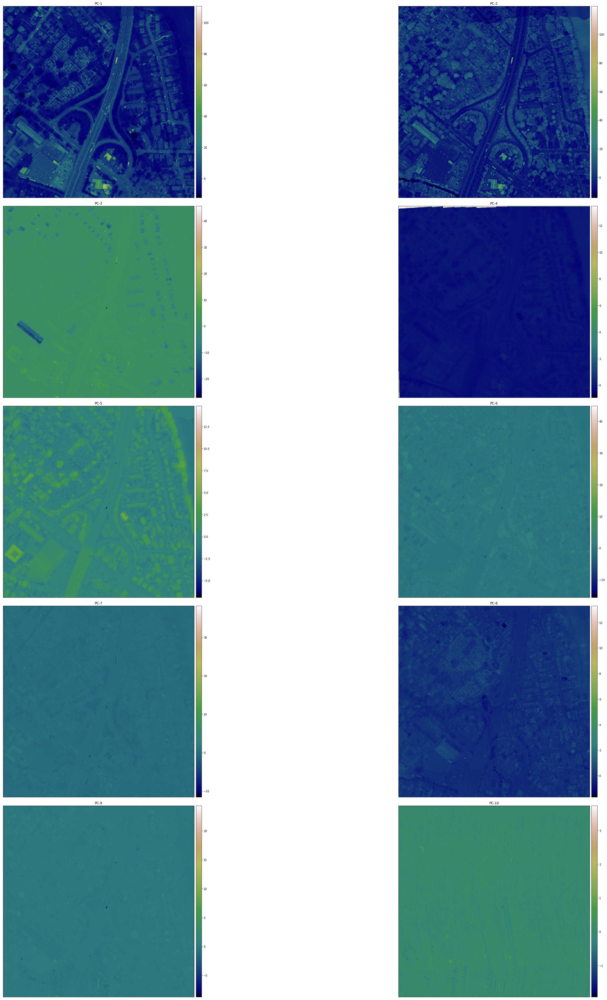

In [32]:
ep.plot_bands(np.moveaxis(data.reshape((1000, 1000, data.shape[1])), -1, 0),
              cmap = 'gist_earth',
              cols = 2,
              figsize = (50, 50),
              title = [f'PC-{i}' for i in range(1,11)])

plt.show()

## Incremental PCA

In [33]:
from sklearn.decomposition import IncrementalPCA
from scipy import sparse

transformer = IncrementalPCA(n_components=4, batch_size=800)
X_sparse = sparse.csr_matrix(X_scaled)
X_transformed = transformer.fit_transform(X_sparse)

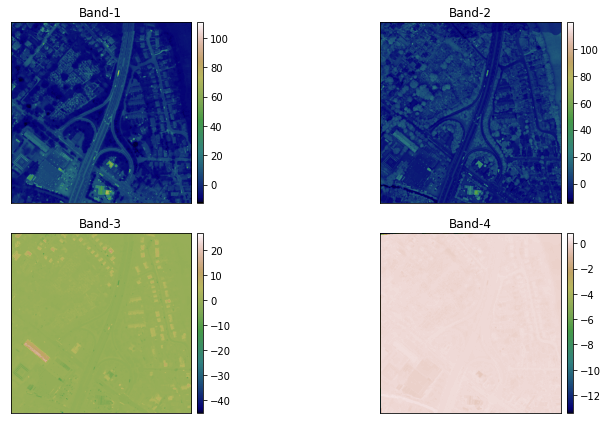

In [41]:
ep.plot_bands(np.moveaxis(X_transformed.reshape((1000, 1000, X_transformed.shape[1])), -1, 0),
              cmap = 'gist_earth',
              cols = 2,
              figsize = (12, 6),
              title = [f'Band-{i}' for i in range(1,5)])

plt.show()

## Independent Component Analysis (ICA)

In [35]:
from sklearn.decomposition import FastICA

ica = FastICA(n_components = 4, random_state=6)


ica_data = ica.fit_transform(X_scaled)


In [36]:
ica_data.shape

(1000000, 4)

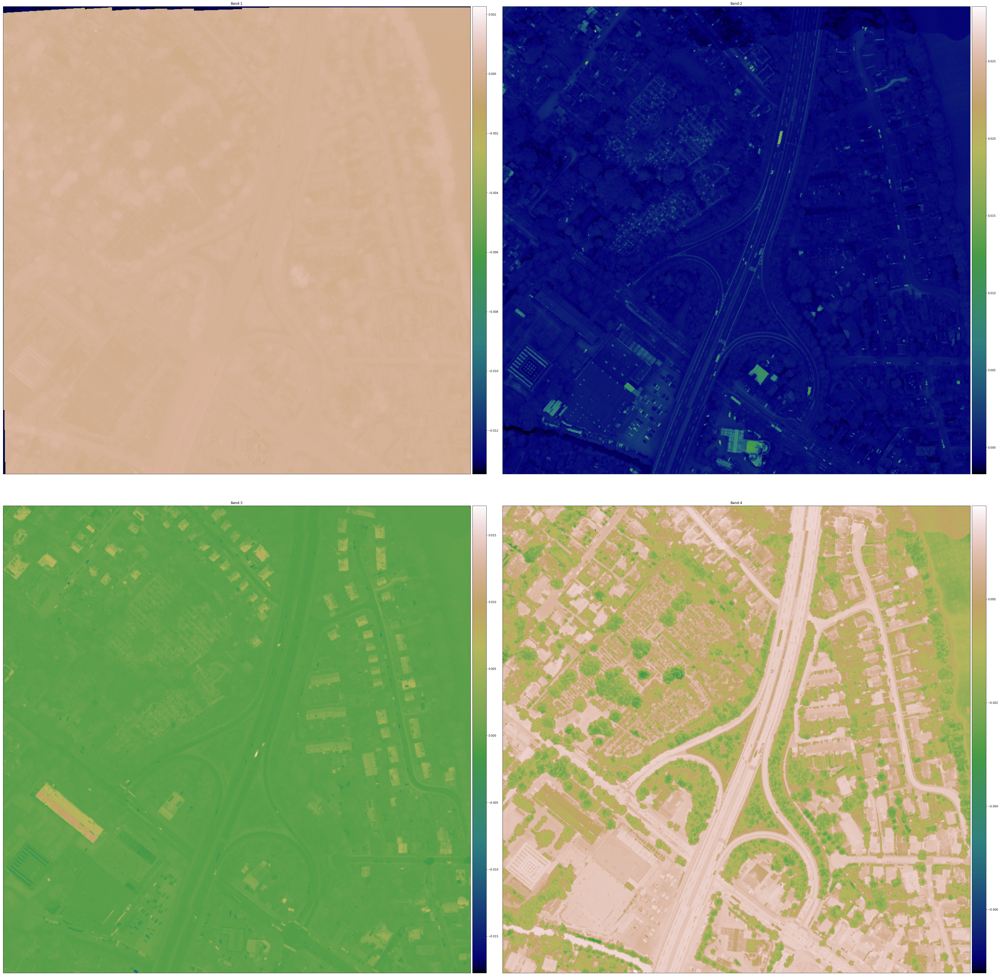

In [42]:
ep.plot_bands(np.moveaxis(ica_data.reshape((1000, 1000, ica_data.shape[1])), -1, 0),
              cmap = 'gist_earth',
              cols = 2,
              figsize = (50, 50),
              title = [f'Band-{i}' for i in range(1,5)])

plt.show()

In [39]:
ica_data.shape




(1000000, 4)